# Exploratory Data Analysis - Bankruptcy Dataset

In this notebook, I will be performing Exploratory Data Analysis to try and understand what factors lead to a company going bankrupt.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
from sklearn.feature_selection import VarianceThreshold

In [2]:
data = pd.read_csv('../data/data_cleaned.csv', index_col=False)

Understanding the statistics and distributions of the data

In [3]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Bankrupt?,6819.0,0.032263,0.176710,0.0,0.000000,0.000000,0.000000,1.0
ROA(C) before interest and depreciation before interest,6819.0,0.505180,0.060686,0.0,0.476527,0.502706,0.535563,1.0
ROA(A) before interest and % after tax,6819.0,0.558625,0.065620,0.0,0.535543,0.559802,0.589157,1.0
ROA(B) before interest and depreciation after tax,6819.0,0.553589,0.061595,0.0,0.527277,0.552278,0.584105,1.0
operating gross margin,6819.0,0.607948,0.016934,0.0,0.600445,0.605997,0.613914,1.0
...,...,...,...,...,...,...,...,...
Net income to stockholder's Equity,6819.0,0.840402,0.014523,0.0,0.840115,0.841179,0.842357,1.0
liability to equity,6819.0,0.280365,0.014463,0.0,0.276944,0.278778,0.281449,1.0
Degree of financial leverage (DFL),6819.0,0.027541,0.015668,0.0,0.026791,0.026808,0.026913,1.0
Interest coverage ratio( Interest expense to EBIT ),6819.0,0.565358,0.013214,0.0,0.565158,0.565252,0.565725,1.0


In [4]:
data.head()

,Bankrupt?,ROA(C) before interest and depreciation before interest,ROA(A) before interest and % after tax,ROA(B) before interest and depreciation after tax,operating gross margin,realized sales gross margin,operating profit rate,tax Pre-net interest rate,after-tax net interest rate,non-industry income and expenditure/revenue,...,one if total liabilities exceeds total assets zero otherwise,net income to total assets,total assets to GNP price,No-credit interval,Gross profit to Sales,Net income to stockholder's Equity,liability to equity,Degree of financial leverage (DFL),Interest coverage ratio( Interest expense to EBIT ),equity to liability
0,1,0.370594,0.424389,0.405750,0.601457,0.601457,0.998969,0.796887,0.808809,0.302646,...,0,0.716845,0.009219,0.622879,0.601453,0.827890,0.290202,0.026601,0.564050,0.016469
1,1,0.464291,0.538214,0.516730,0.610235,0.610235,0.998946,0.797380,0.809301,0.303556,...,0,0.795297,0.008323,0.623652,0.610237,0.839969,0.283846,0.264577,0.570175,0.020794
2,1,0.426071,0.499019,0.472295,0.601450,0.601364,0.998857,0.796403,0.808388,0.302035,...,0,0.774670,0.040003,0.623841,0.601449,0.836774,0.290189,0.026555,0.563706,0.016474
3,1,0.399844,0.451265,0.457733,0.583541,0.583541,0.998700,0.796967,0.808966,0.303350,...,0,0.739555,0.003252,0.622929,0.583538,0.834697,0.281721,0.026697,0.564663,0.023982
4,1,0.465022,0.538432,0.522298,0.598783,0.598783,0.998973,0.797366,0.809304,0.303475,...,0,0.795016,0.003878,0.623521,0.598782,0.839973,0.278514,0.024752,0.575617,0.035490


As we saw in the data wrangling notebook, there was a feature with the same value for the min and max values, meaning this is a useless column. We will be using sklearn's [Variance Threshold](https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.VarianceThreshold.html) to remove any additional columns with 0 vairance that might have been missed. We will also be checking for any duplicated data

In [5]:
X = data.drop('Bankrupt?', axis=1)
selector = VarianceThreshold()
print("Original feature shape:", X.shape)
new_X = selector.fit_transform(X)
print("Transformed feature shape:", new_X.shape)

print("Sum of duplicated data:", data.duplicated().sum())

Original feature shape: (6819, 94)
Transformed feature shape: (6819, 94)
Sum of duplicated data: 0


Every other column has at least some variance, so we will now explore further

What does the distribution of the target class look like?

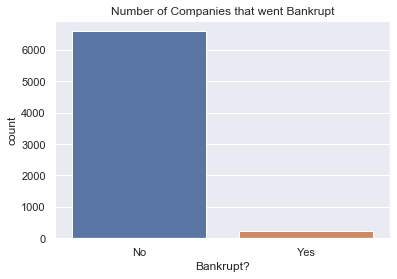

0    6599
1     220
Name: Bankrupt?, dtype: int64


In [6]:
fig, ax = plt.subplots()
sns.countplot(x='Bankrupt?', data=data)
plt.xticks([0,1], ['No', 'Yes'])
plt.title('Number of Companies that went Bankrupt')
plt.show();
print(data['Bankrupt?'].value_counts())

This dataset has a very unbalanced target feature.  That means we will need to choose a different scoring metric than accuracy, as even just guessing "No" will be very accurate

Using a boxplot to check for outliers in the dataset

The number of bins was increased from the default 10, because the majority of the continuous data values are so similar, with usually 1 value in the tails.  This hid a lot of the view of the normal distribution of a lot of the features

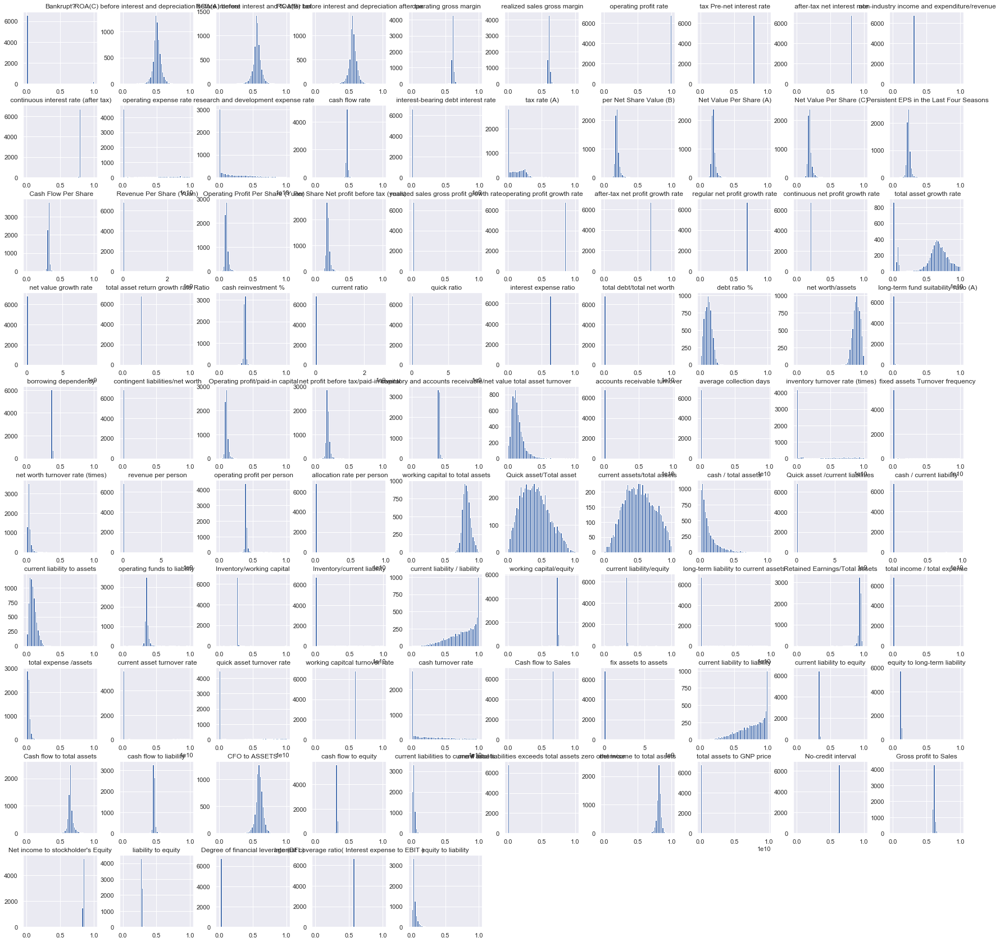

In [8]:
data.hist(bins=50, figsize=(30,30));

# What seems to be correlated with our target variable?

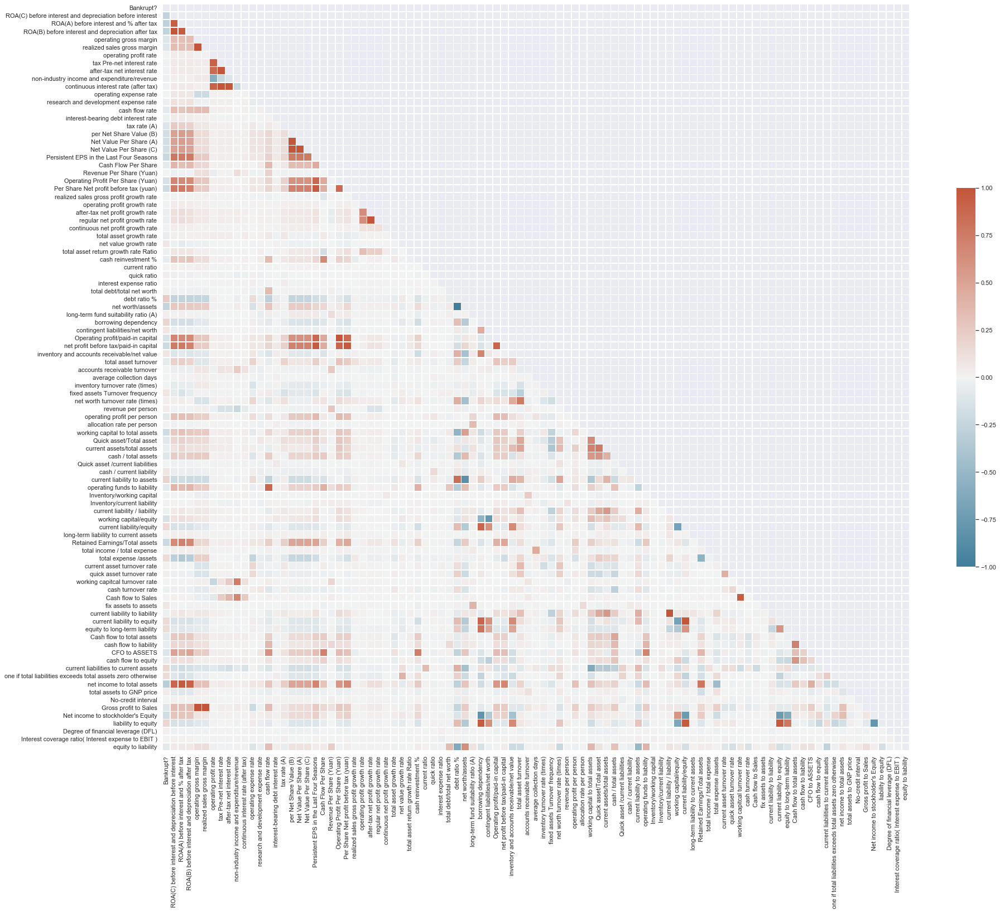

In [70]:
corr = data.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))
f, ax = plt.subplots(figsize=(30, 25))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5});

# Looking for outliers

In [19]:
from scipy.stats import zscore
outliers = data.apply(zscore)

Seems that there are data points that are up to 82 std deviations from the mean.  

In [20]:
outliers.values.max()

82.57118141337206

Because this dataset is so unbalanced in the target column, the companies that went bankrupt (value of 1) is actually more than 3 std. deviations from the mean. If using a threshold of 3 for the z-score defines an outlier, all of the minority class will be removed when removing outliers

In [36]:
outliers['Bankrupt?'].value_counts().values

array([6599,  220], dtype=int64)

The target column will therefore be removed.  All rows in the rest of the dataframe with z scores greater than 3 will be removed.  

In [22]:
data_no_target = data.drop('Bankrupt?', axis=1)
z_scores = zscore(data_no_target)
abs_z_scores = np.abs(z_scores)
filtered_entries = (abs_z_scores < 3).all(axis=1)
nooutliers = data[filtered_entries]

In [64]:
print("Original number of data points:",data.shape)
print('Number of data points less than 3 std. dev away from the mean:',nooutliers.shape)
print('Number of outliers removed :' , data.shape[0] - nooutliers.shape[0])
print('Number of majority class (not bankrupt) removed as outliers', data['Bankrupt?'].value_counts().values[0]-nooutliers['Bankrupt?'].value_counts().values[0])
print('Percentage of majority class (Not bankrupt) removed:', 
abs(np.round((nooutliers['Bankrupt?'].value_counts().values[0]-data['Bankrupt?'].value_counts().values[0])/data['Bankrupt?'].value_counts().values[0]*100)))
print('Number of minority class (bankrupt) removed as outliers', data['Bankrupt?'].value_counts().values[1]-nooutliers['Bankrupt?'].value_counts().values[1])
print('Percentage of minority class (bankrupt) removed:', 
abs(np.round((nooutliers['Bankrupt?'].value_counts().values[1]-data['Bankrupt?'].value_counts().values[1])/data['Bankrupt?'].value_counts().values[1]*100)))

Original number of data points: (6819, 95)
Number of data points less than 3 std. dev away from the mean: (4909, 95)
Number of outliers removed : 1910
Number of majority class (not bankrupt) removed as outliers 1809
Percentage of majority class (Not bankrupt) removed: 27.0
Number of minority class (bankrupt) removed as outliers 101
Percentage of minority class (bankrupt) removed: 46.0


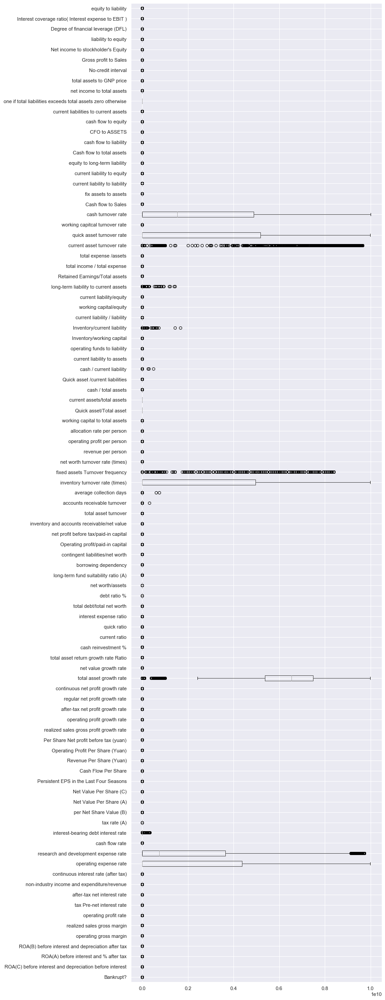

In [65]:
nooutliers.boxplot(vert=False, figsize=(10,40))

# What does the correlation matrix look like after removal of the outliers?

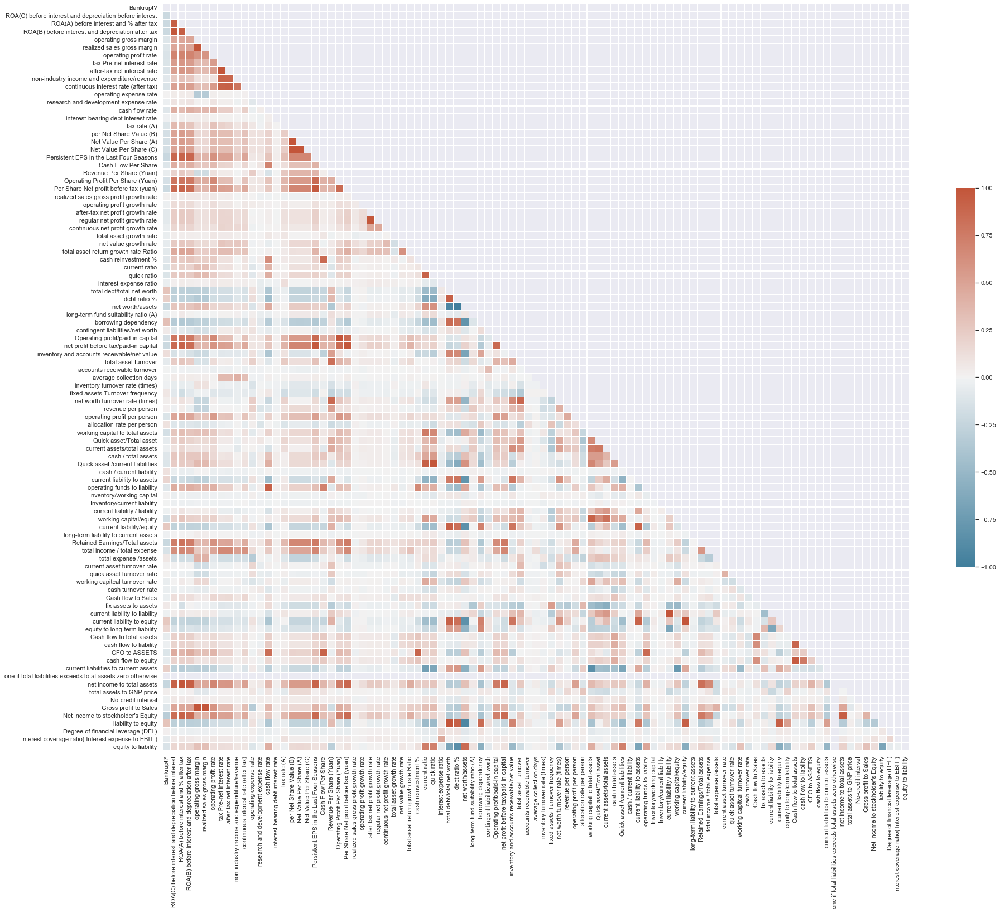

In [71]:
corr = nooutliers.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))
f, ax = plt.subplots(figsize=(30, 25))
cmap = sns.diverging_palette(230, 20, as_cmap=True)
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5});

Seems that the removal of outliers allows the relationships between the features to show.  What does the histogram of this dataset look like?

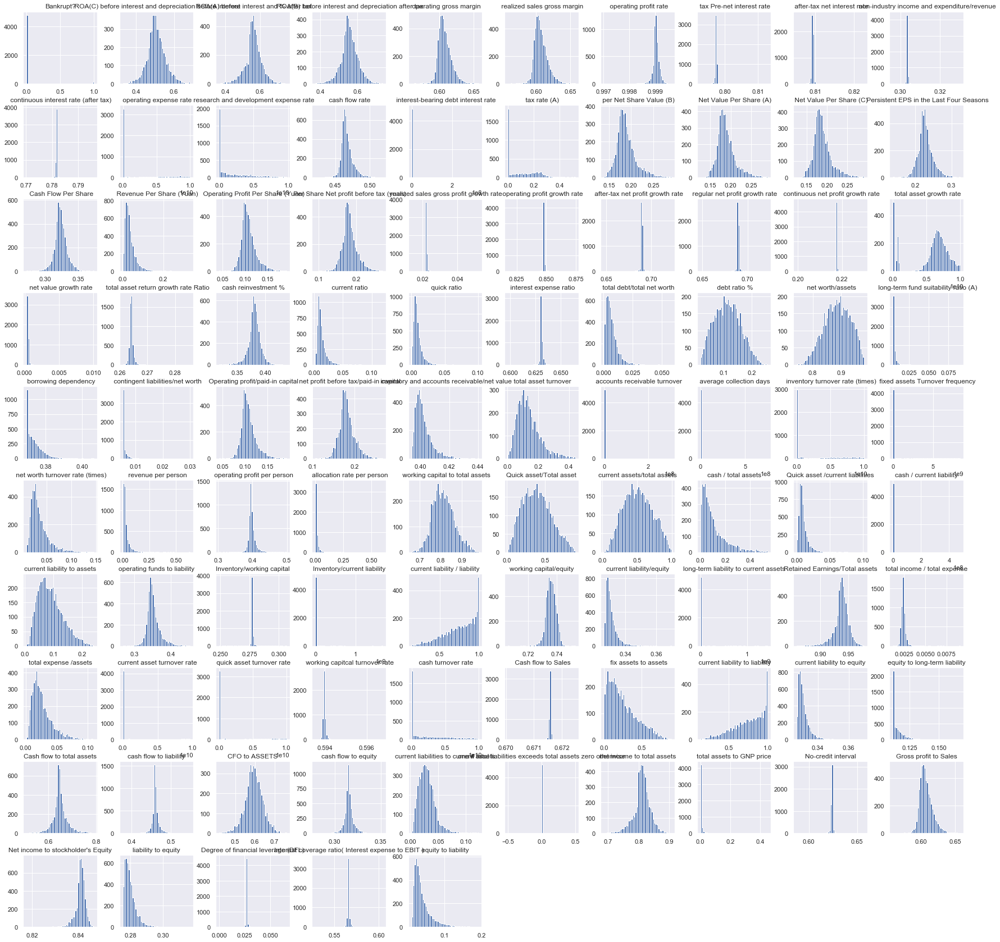

In [78]:
nooutliers.hist(bins=50, figsize=(30,30));

## Create csv of nooutlier dataset to move to preprocessing phase

We will next pre process the data and figure out what to do with the unbalanced nature of the classes

In [79]:
nooutliers.to_csv('../data/nooutlier_EDA.csv', index=False)